In [1]:
import numpy as np
import matplotlib.pyplot as plt
import desc.io
from desc.grid import LinearGrid, ConcentricGrid
from desc.objectives import (
    ObjectiveFunction,
    FixBoundaryR,
    FixBoundaryZ,
    FixPressure,
    FixCurrent,
    FixIota,
    FixPsi,
    AspectRatio,
    ForceBalance,
    QuasisymmetryTwoTerm,
    RotationalTransform
)
from desc.optimize import Optimizer
from desc.plotting import (
    plot_grid,
    plot_boozer_modes,
    plot_boozer_surface,
    plot_qs_error,
    plot_boundaries,
    plot_boundary,
    plot_3d
)

from desc.equilibrium import Equilibrium
from desc.geometry import FourierRZToroidalSurface
from desc.profiles import PowerSeriesProfile

DESC version 0+untagged.9468.g2e867ea.dirty,using JAX backend, jax version=0.4.14, jaxlib version=0.4.14, dtype=float64
Using device: CPU, with 33.17 GB available memory


In [2]:
eq_fam = desc.io.load("inputs/nfp2_QA.h5")
eq_init = eq_fam[-1]
eq_qs = eq_init.copy()

In [3]:
optimizer = Optimizer("lsq-exact")

grid_vol = LinearGrid(
    M=eq_qs.M_grid,
    N=eq_qs.N_grid,
    NFP=eq_qs.NFP,
    rho=np.arange(0.1,1.1,0.1),
    sym=eq_qs.sym
)

In [4]:
for maxMode in range(1,2):
    fixed_R_modes = np.vstack(([0,0,0], eq_qs.surface.R_basis.modes[np.max(np.abs(eq_qs.surface.R_basis.modes), 1) > maxMode, :]))
    free_R_modes = eq_qs.surface.R_basis.modes[np.max(np.abs(eq_qs.surface.R_basis.modes), 1) <= maxMode, :]
    free_R_modes = free_R_modes[np.max(np.abs(free_R_modes), 1) > 0, :]
    
    fixed_Z_modes = eq_qs.surface.Z_basis.modes[np.max(np.abs(eq_qs.surface.Z_basis.modes), 1) > maxMode, :]
    free_Z_modes = eq_qs.surface.Z_basis.modes[np.max(np.abs(eq_qs.surface.Z_basis.modes), 1) <= maxMode, :]
    constWeight = 10
    
    objective_f = ObjectiveFunction((
        AspectRatio(eq=eq_qs, target=6, weight=1),
        #FixPressure(eq=eq_qs, weight=constWeight),
        #FixCurrent(eq=eq_qs, weight=constWeight),
        #FixPsi(eq=eq_qs, weight=constWeight),
        ForceBalance(eq=eq_qs, weight=10),
    ))

    numRbounds = len(free_R_modes)
    numZbounds = len(free_Z_modes)
    rub = np.ones(numRbounds)
    zub = np.ones(numZbounds)
    Rbounds = (-rub, rub)
    Zbounds = (-zub, zub)
    
    constraints = (
        FixBoundaryR(eq=eq_qs, modes=fixed_R_modes),
        FixBoundaryZ(eq=eq_qs, modes=fixed_Z_modes),
        FixPressure(eq=eq_qs),  # fix pressure profile
        FixPsi(eq=eq_qs),
        FixCurrent(eq=eq_qs),
    )    
    eq_qs, result = eq_qs.optimize(
        objective=objective_f,
        constraints=constraints,
        optimizer=optimizer,
        copy=True,
        x_scale = np.ones(363),
        verbose=2,
        maxiter=20,
        options={}
    )


Building objective: aspect ratio
Precomputing transforms
Timer: Precomputing transforms = 477 ms
Building objective: force
Precomputing transforms
Timer: Precomputing transforms = 613 ms
Timer: Objective build = 2.55 sec
Building objective: lcfs R
Building objective: lcfs Z
Building objective: fixed pressure
Building objective: fixed Psi
Building objective: fixed current
Building objective: self_consistency R
Building objective: self_consistency Z
Building objective: lambda gauge
Building objective: axis R self consistency
Building objective: axis Z self consistency
Timer: Objective build = 1.42 sec
Timer: Linear constraint projection build = 1.77 sec
x0 [ 9.92576484e-07  2.10877062e-07 -2.01398947e-09 -7.27421892e-08
 -6.03569165e-07  1.49115365e-07 -7.13417408e-10 -6.04997045e-07
 -7.28649972e-08 -8.99265133e-10  4.17626198e-02  9.39524756e-09
  4.17636782e-02 -1.02297969e-01 -1.20406205e-08  4.17626181e-02
 -1.02297971e-01  1.45992240e-07 -1.16976130e-08 -2.91725489e-07
  5.11489845

In [5]:
print(result.x.shape, result.allx[-1].shape)
print(objective_f.compute_scalar(result.allx[-1]))
# print(result.allx[-1])
x_temp = np.array(result.allx[-1])
# print(x_temp)
x_temp[np.abs(x_temp) < 1e-8] = 0.0
print(x_temp[np.abs(x_temp) > 1e-6])
print(objective_f.compute_scalar(x_temp))

(155,) (363,)
5.393603750136294e-10
[ 9.97229044e-01  1.62945736e-01  2.75053058e-03  1.33794983e-04
  2.04253447e-05 -1.70541109e-01 -4.74498002e-05  2.08420607e-04
  4.74498002e-05 -9.62914894e-02  7.00392374e-03 -1.23141673e-05
 -5.32241203e-04 -9.34909176e-06  8.30000000e-02  9.94498939e-01
  1.00000000e+00  1.63079531e-01 -1.70332688e-01]
5.393905182666082e-10


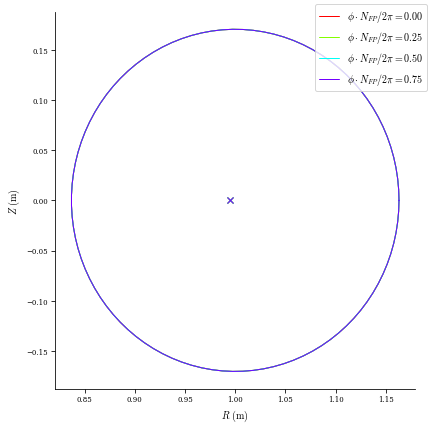

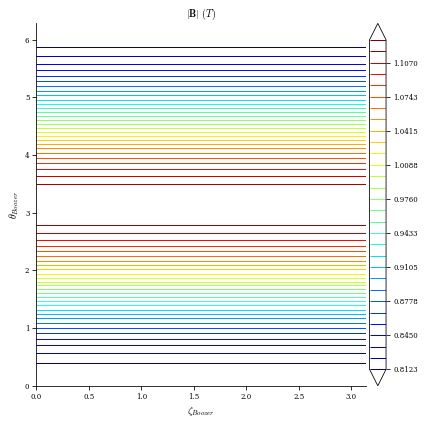

In [6]:
plot_boundary(eq_qs, figsize=(6,6))
plot_boozer_surface(eq_qs, figsize=(6,6))
plot_3d(eq_qs, "|B|", figsize=(6,6))

In [ ]:
eq_qs = eq_init.copy()
objective_f = ObjectiveFunction((
#     AspectRatio(eq=eq_qs, target=6, weight=1),
    #FixPressure(eq=eq_qs, weight=constWeight),
    #FixCurrent(eq=eq_qs, weight=constWeight),
    #FixPsi(eq=eq_qs, weight=constWeight),
    ForceBalance(eq=eq_qs, weight=10),
))
optimizer = Optimizer("Turbo1")

for maxMode in range(1,2):
    fixed_R_modes = np.vstack(([0,0,0], eq_qs.surface.R_basis.modes[np.max(np.abs(eq_qs.surface.R_basis.modes), 1) > maxMode, :]))
    free_R_modes = eq_qs.surface.R_basis.modes[np.max(np.abs(eq_qs.surface.R_basis.modes), 1) <= maxMode, :]
    free_R_modes = free_R_modes[np.max(np.abs(free_R_modes), 1) > 0, :]
    
    fixed_Z_modes = eq_qs.surface.Z_basis.modes[np.max(np.abs(eq_qs.surface.Z_basis.modes), 1) > maxMode, :]
    free_Z_modes = eq_qs.surface.Z_basis.modes[np.max(np.abs(eq_qs.surface.Z_basis.modes), 1) <= maxMode, :]
    constWeight = 10
    numRbounds = len(free_R_modes)
    numZbounds = len(free_Z_modes)
    rub = np.ones(numRbounds)
    zub = np.ones(numZbounds)
    Rbounds = (-rub, rub)
    Zbounds = (-zub, zub)
    
    constraints = (
        FixBoundaryR(eq=eq_qs, modes=fixed_R_modes),
        FixBoundaryZ(eq=eq_qs, modes=fixed_Z_modes),
        FixPressure(eq=eq_qs),  # fix pressure profile
        FixPsi(eq=eq_qs),
        FixCurrent(eq=eq_qs),
    )    
    global_eq_qs, result = eq_qs.optimize(
        objective=objective_f,
        constraints=constraints,
        optimizer=optimizer,
        copy=True,
        x_scale = np.ones(363),
        verbose=2,
        maxiter=10000,
        options={"trust_regions":1, "box_size":1e-2, "training_steps": 100, "batch_size":2000}
    )

Building objective: force
Precomputing transforms
Timer: Precomputing transforms = 57.8 ms
Timer: Objective build = 195 ms
Building objective: lcfs R
Building objective: lcfs Z
Building objective: fixed pressure
Building objective: fixed Psi
Building objective: fixed current
Building objective: self_consistency R
Building objective: self_consistency Z
Building objective: lambda gauge
Building objective: axis R self consistency
Building objective: axis Z self consistency
Timer: Objective build = 718 ms
Timer: Linear constraint projection build = 1.13 sec
x0 [ 9.92576484e-07  2.10877062e-07 -2.01398947e-09 -7.27421892e-08
 -6.03569165e-07  1.49115365e-07 -7.13417408e-10 -6.04997045e-07
 -7.28649972e-08 -8.99265133e-10  4.17626198e-02  9.39524756e-09
  4.17636782e-02 -1.02297969e-01 -1.20406205e-08  4.17626181e-02
 -1.02297971e-01  1.45992240e-07 -1.16976130e-08 -2.91725489e-07
  5.11489845e-02  9.05229868e-09  1.47633551e-07  5.11489871e-02
  3.86341355e-10 -1.22349760e-07  8.04983864e-1

  1.23507169e-07 -2.78745509e-01  1.23480664e-07]
Using dtype = torch.float64 
Using device = cpu
Initial trust region: length_init=0.8, length_min=0.0009765625, length_max=25.6
Starting from fbest = 0.6752, log(fbest) = -0.3928
Initial loss:  1.442249680674857
Final loss:  0.7058734232752149
2310) New best: 0.5206, log(fbest) = -0.6528
Initial loss:  0.3339119974590471
Final loss:  -1.970332070173205
4310) New best: 0.446, log(fbest) = -0.8074
Initial loss:  -0.3972913134377974
Final loss:  -2.574511650187308
[TR EXPAND] Trust region expanded: 0.8 -> 1.6
6310) New best: 0.3796, log(fbest) = -0.9686
Initial loss:  -0.7361221293404571


In [ ]:
print(objective_f.compute_scalar(result.allx[np.argmin(result.allfun)]))
print(np.shape(result.x), np.shape(result.allx[-1]), np.shape(result.allx))
print(result.allx[0][np.abs(result.allx[0]) > 1e-6])
print(result.allx[-1][np.abs(result.allx[-1]) > 1e-6])

In [ ]:
plot_boundary(global_eq_qs, figsize=(6,6))
plot_boozer_surface(global_eq_qs, figsize=(6,6))
plot_3d(global_eq_qs, "|B|", figsize=(6,6))

In [ ]:
objective_f.print_value(result.allx[np.argmin(result.allfun)])